Participant ID - ML 073 

Name - Ayush Agarwal 

College - IIT BHU Varanasi 

Branch - Electronics 2nd year 

Submission for regression question (Q2) , IIT Pallakad ML Prediction Competition 


In [42]:
##########################################
# IMPORTING THE LIBRARIES

# PANDAS , MATPLOTLIB , NUMPY , SEABORN 

import pandas as pd 
import numpy as np 

pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
################################

In [43]:
###############################
# LOADING THE DATA 

# LOADING THE DATA USING READ CSV OF PANDAS 
training_data = pd.read_csv("/content/Train_data_regression.csv")
X = training_data.copy()

###################################
# CHECKING THE DATA 

# JUST GATHERING BASIC INFO ABOUT IT 

# This commented option I used before to display the whole data 
#pd.set_option('display.max_columns', None)
print(X.describe())
#pd.reset_option('all')

# Gathering info like description , length of data , what it looks like , feels like etc 
print(len(X.columns))
# print(X.head())
# print(X.tail())
################################
# intresting to note that the columns have mean close to 0 and standard deviation close to 1 always 

                 0            1  ...          149            y
count  5880.000000  5880.000000  ...  5880.000000  5880.000000
mean     -0.007394     0.000425  ...    -0.023888    16.448264
std       1.005750     0.990548  ...     0.998827   546.081390
min      -3.817828    -3.427435  ...    -3.097664 -1923.316215
25%      -0.703793    -0.666062  ...    -0.683766  -349.282875
50%      -0.010246    -0.011336  ...    -0.028721     8.312237
75%       0.675946     0.681987  ...     0.660288   382.141928
max       3.498253     3.387892  ...     3.724939  2122.244531

[8 rows x 151 columns]
151


In [44]:
################################
# MISSING VALUES 
#######################################
# CHECKING FOR MISSING VALUES 

# code to display values when there are too many values and pandas shows ... 
# only needed it while exploring 
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
# pd.reset_option('all')

# X1 is the number of null values in each column 
X1 = X.isnull().sum().to_numpy()
# printing it gives a long list , so I used better method ahead
# print(X1)

# empty_cols is an array which stores the IDs of the columns which are empty 
empty_cols = np.zeros(19)

# jcol is just a counter variable for loops 
jcol=0

# Using loops to print the number of the column as well as the number of values missing in that column , and only printing it when 
# the number of missing values is not zero 
print("Here are the columns with missing data , along with the number of missing values ")
print()
no_missing_values_cols = 0
for i in range(0,151):
  if(X1[i]!=0):
    print(str(i),str(X1[i]))
    no_missing_values_cols = no_missing_values_cols + 1
    empty_cols[jcol] = i
    jcol = jcol + 1
    
print()

# Printing the information I have collected about the missing values from the data 
print("The number of missing values columns are " + str(no_missing_values_cols))
print()

# empty_cols is an array containing the columns with missing values 
print("Array of column numbers with missing values :")
print(empty_cols)
#####################################
# HANDLING MISSING VALUES 

# MY REASONING - 
# Since the number of missing values are relatively small (200 compared to 5800, about 3%), hence i will use a SIMPLE IMPUTER

from sklearn.impute import SimpleImputer

# Replacing by median instead of mean since I havent gotten rid of outliers yet , and as I discover later in the code , the data has many 
# outliers 
median_imputer_1 = SimpleImputer(strategy='median')
imputed_X = pd.DataFrame(median_imputer_1.fit_transform(X))

# Imputer removes the columns so putting them back 
imputed_X.columns = X.columns

# Assigning the imputed values back to the original dataframe 
X = imputed_X

##########################
# just RECHECKING whether the imputer worked or not 
X1 = X.isnull().sum().to_numpy()
# print(X1)

# This X1 gave me all 0s , hence showing that all the null values have been removed 

######################################


Here are the columns with missing data , along with the number of missing values 

25 231
34 232
35 233
46 229
47 229
49 231
63 233
73 234
77 231
78 225
84 224
85 228
88 229
93 453
101 230
109 230
112 212
145 234
148 232

The number of missing values columns are 19

Array of column numbers with missing values :
[ 25.  34.  35.  46.  47.  49.  63.  73.  77.  78.  84.  85.  88.  93.
 101. 109. 112. 145. 148.]


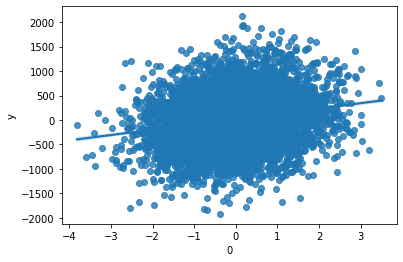

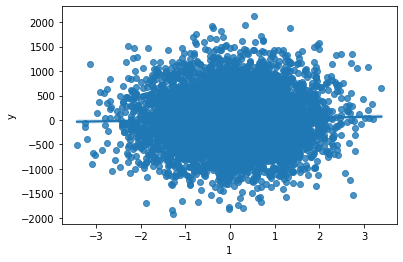

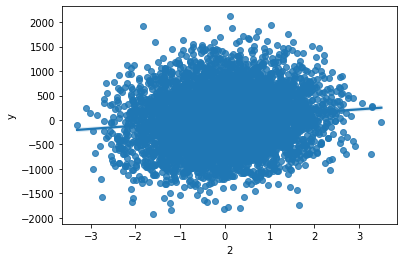

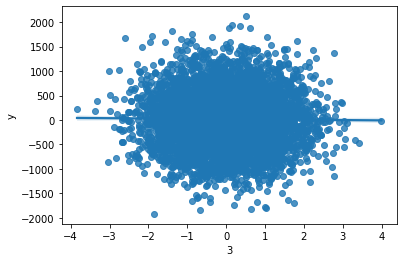

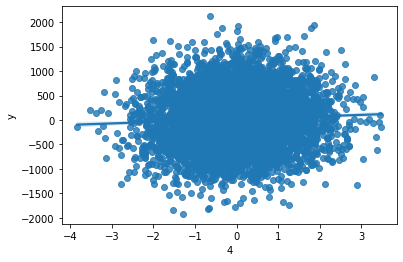

...

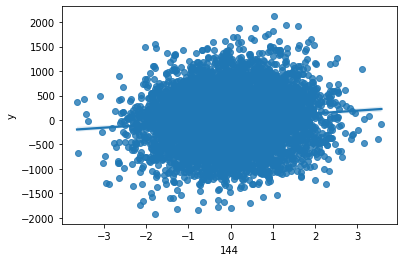

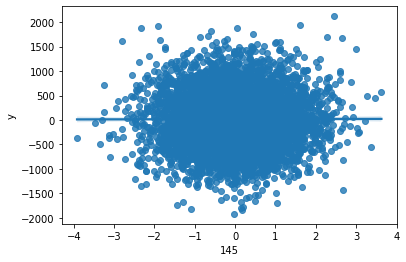

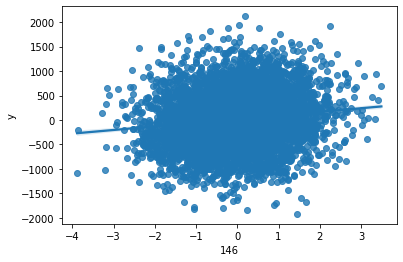

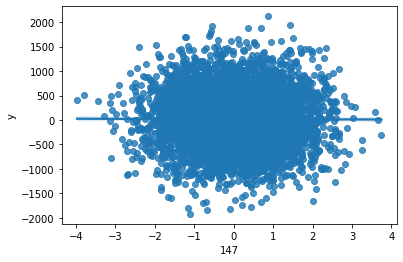

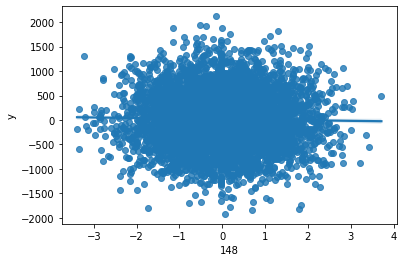

In [45]:
###########################
# PLOTTING THE DATA TO OBSERVE RELATIONS AMONG THE DATA AND THE TARGET VARIABLES 
 
# plotting each column with the target column and seeing the graph 
# print(X.head())

# Making the required scatter plots with the regression lines 
for i in range(0,149):
  sns.regplot(x=X[str(i)], y=X['y'])
  plt.show()

# For each of these plots , I have received an elliptical or a circular cloud 
# Hence the data needs to be processed even now 
############################


In [46]:
#######################################
# CHECKING FOR DUPLICATES 

duplicate_values = X.duplicated()
#print(duplicate_values)
for i in range(0,5879):
  if(duplicate_values[i]==True):
    print(str(i),str(duplicate_values[i]))

# Hence NO DUPLICATES in the data 
##########################################

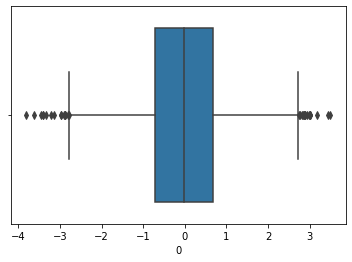

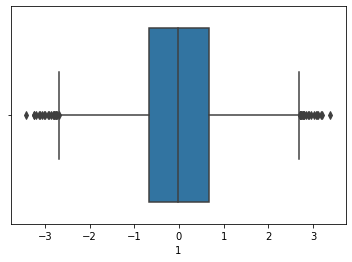

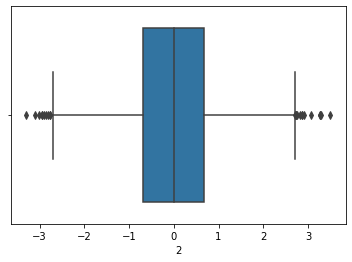

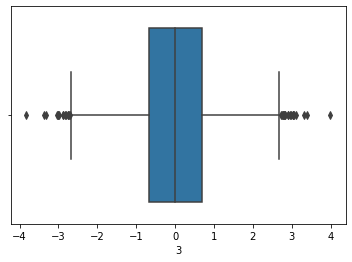

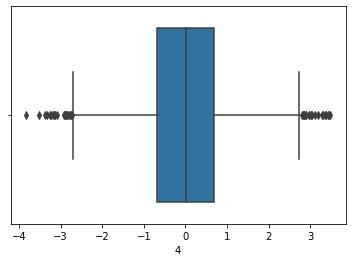

...

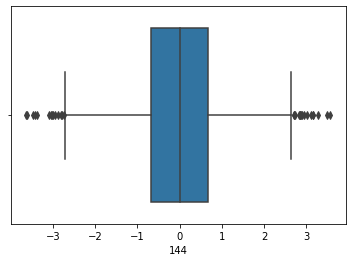

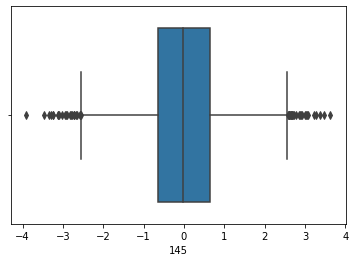

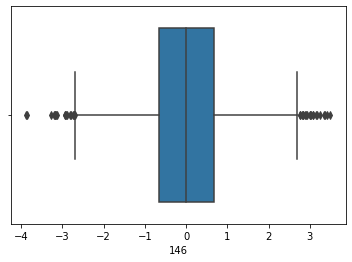

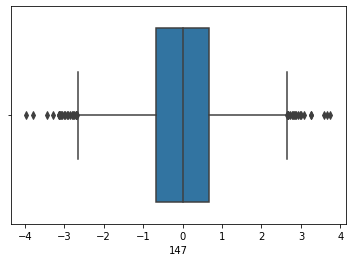

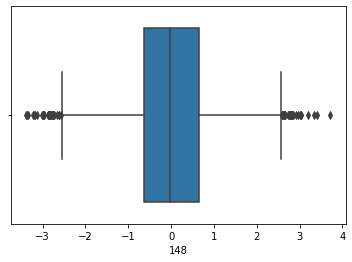

In [47]:
###########################################
# DETECTING THE OUTLIERS 

# Making a BOX PLOT of all the columns 
for i in range(0,(len(X.columns)-2)):
  sns.boxplot(x=X[str(i)])
  plt.show()
  
# Clearly a lot of data is outside the IQR Whiskers range , and removing using IQR isn't the best way for this 
###################################################


In [48]:
######################################
# SPLITTING THE TARGET VARIABLE FROM THE ORIGINAL DATA 

# All the code behind this point neither affected y nor was affected by y , hence we dont face any problem in doing it now 

# Removing the target variable from the dataset 
Y = X['y']
print(Y)

# Now removing the target variable from the dataset 
X.drop(columns = ['y'], inplace=True)
print(X)
print(type(X))

#######################################

0       -456.665254
1       1058.205923
2       -434.143673
3        977.514618
4        -15.042199
           ...     
5875    -691.660101
5876    1062.127679
5877    -268.120596
5878    -883.462069
5879     296.756737
Name: y, Length: 5880, dtype: float64
             0         1         2  ...       147       148       149
0    -0.746945  0.846646 -0.202470  ... -0.500914  0.003735 -0.353331
1     0.267893  0.686836 -2.099945  ... -1.312298 -0.938679 -1.134801
2     0.774361  0.812023  1.057683  ...  0.126215  0.572231 -1.147129
3    -0.625636 -0.827090  0.602128  ... -0.201219 -1.294190 -0.316879
4    -0.976274 -0.673587 -0.103793  ...  1.216420 -0.520947  0.618585
...        ...       ...       ...  ...       ...       ...       ...
5875  0.800585  0.483879 -0.501917  ... -0.913591  0.270359  0.375315
5876  0.170425 -0.208798 -0.632120  ... -0.105197 -0.021068 -0.419381
5877  0.998730  0.172165 -0.385435  ... -0.766305 -2.532606 -1.482317
5878  0.306900  0.663711  0.153091  ...  0

In [49]:
######################################
# DETECTING OF OUTLIER USING Z SCORE FOR THE DATA 

from scipy import stats 

# Calculating the Z score 
z_score_1 = np.abs(stats.zscore(X))
print(z_score_1)

# Setting the threshold value of Z for comparing 
z_threshold = 3.5

# Finding the number of rows where the data's Z score crosses the threshold 
print(len(np.where(z_score_1 > z_threshold)[0]))

# for threshold 3 , approx 2000/5800 = 35% data approx 
# for threshold 3.5 , 336/5800 = 5% data approx 

# Clearly , removal of outliers by thresholding via Z score would not be suitable 
# So I decided to use ROBUST SCALER for the data 
######################################

[[0.73538522 0.85436803 0.20128461 ... 0.50587844 0.01163863 0.32985795]
 [0.2737368  0.69301994 2.11219277 ... 1.31729136 0.9404914  1.11231164]
 [0.77735177 0.81941144 1.06778997 ... 0.12127234 0.58599616 1.12465478]
 ...
 [1.00045755 0.17339364 0.3855445  ... 0.77127851 2.55085142 1.46026581]
 [0.31252384 0.66967153 0.15679439 ... 0.79830776 0.45437257 1.65987461]
 [1.76752501 0.2326788  0.69408355 ... 0.46203672 0.41737055 0.03496822]]
402


In [50]:
########################################
# USING THE ROBUST SCALER ON THE DATA 

#Importing the ROBUST SCALER
from sklearn.preprocessing import RobustScaler
print(X.head())
# Using the robust scaler 
robust_scaler_1 = RobustScaler()
X = robust_scaler_1.fit_transform(X)
X = pd.DataFrame(X)

#After scaling data be like 
print(X.head())

########################################


          0         1         2  ...       147       148       149
0 -0.746945  0.846646 -0.202470  ... -0.500914  0.003735 -0.353331
1  0.267893  0.686836 -2.099945  ... -1.312298 -0.938679 -1.134801
2  0.774361  0.812023  1.057683  ...  0.126215  0.572231 -1.147129
3 -0.625636 -0.827090  0.602128  ... -0.201219 -1.294190 -0.316879
4 -0.976274 -0.673587 -0.103793  ...  1.216420 -0.520947  0.618585

[5 rows x 150 columns]
        0         1         2    ...       147       148       149
0 -0.533941  0.636462 -0.148018  ... -0.377622  0.019336 -0.241516
1  0.201588  0.517913 -1.546045  ... -0.987360 -0.715348 -0.822944
2  0.568663  0.610778  0.780441  ...  0.093652  0.462522 -0.832115
3 -0.446019 -0.605137  0.444796  ... -0.152408 -0.992496 -0.214395
4 -0.700153 -0.491266 -0.075315  ...  0.912918 -0.389694  0.481607

[5 rows x 150 columns]


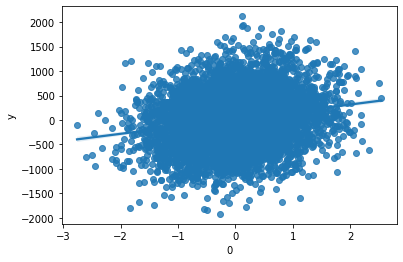

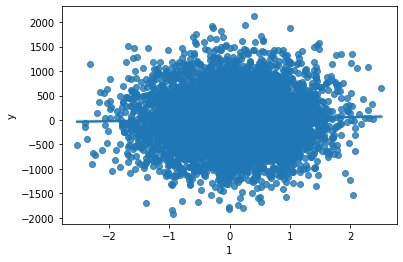

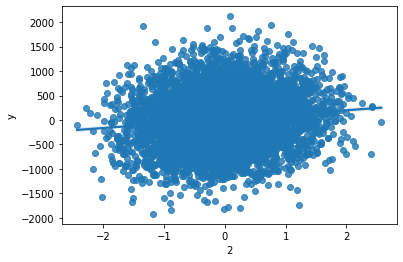

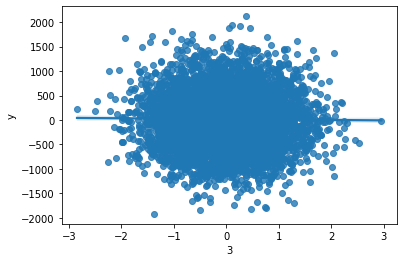

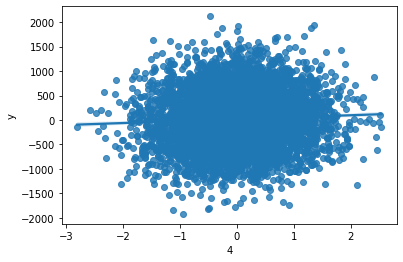

...

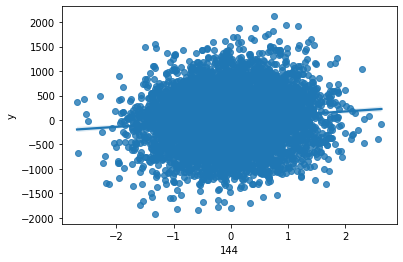

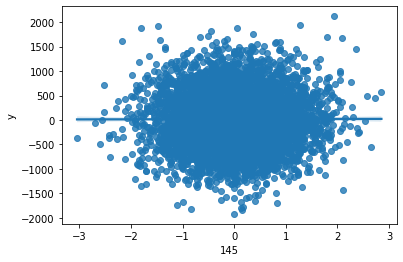

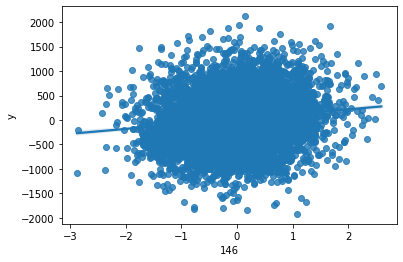

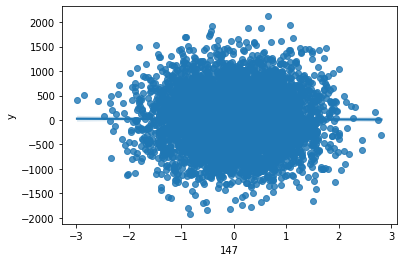

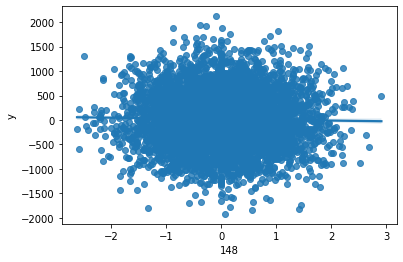

In [51]:
###########################
# PLOTTING THE DATA AGAIN TO SEE THE EFFECT 

# plotting each column with the target column and seeing the graph 
# print(X.head())

# Making the required scatter plots with the regression lines 
for i in range(0,149):
  sns.regplot(x=X[i], y=Y)
  plt.show()

# For each of these plots , I have received an elliptical or a circular cloud
# But this time the clouds look more aligned to the line , hence preprocessing working 

############################

In [52]:
#####################################################################
# THE MODEL 
#############################################
# I have used both POLYNOMIAL REGRESSION AND LINEAR REGRESSION 
# Finally LINEAR REGRESSION works better 

##########################################
# Polynomial regression 

# Splitting the data into testing and training data using sklearn 
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X, Y, train_size=0.8, test_size=0.2,
                                                      random_state=0)

# Importing the required libraries for linear and polynomial regression 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Code for polynomial regression , which has been commented since linear worked better (which was obvious from the graphs why)
# poly_reg = PolynomialFeatures(degree=1)
# X_train_2 = poly_reg.fit_transform(X_train)
# X_valid_2 = poly_reg.transform(X_valid)

# Doing the Linear Regression 
lin_reg = LinearRegression(normalize=True)

# Training 
lin_reg.fit(X_train_2,y_train)

# Getting the predictions on the testing and the training data 
train_pred = lin_reg.predict(X_train_2)
test_pred = lin_reg.predict(X_valid_2)

# Now calculating the RMSE eror for the predictions 

# Importing the required libraries for error calculation 
from sklearn.metrics import mean_squared_error
import math 
from math import sqrt 

# Calculating 
rmse_train = sqrt(mean_squared_error(y_train,train_pred))
rmse_test = sqrt(mean_squared_error(y_valid,test_pred))

# Printing the error values 
print("The value of RMSE on training model is :")
print(rmse_train)
print("And the value of RMSE on the testing data is :")
print(rmse_test)

##############################################


The value of RMSE on training model is :
93.78403881437843
And the value of RMSE on the testing data is :
97.8025959341105


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_base.py:145: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  FutureWarning,


In [53]:
# ##########################################
# # Just a try I did with XGBoost , which obviously didnt work , since the data was not suitable for it , which could be seen from the graphs 

# #Importing the libraries 
# from xgboost import XGBRegressor
# from math import sqrt 
# # Making the model and setting the hyperparameters 
# xgb_model = XGBRegressor(n_estimators=1000, learning_rate=0.3,random_state=0)
# xgb_model.fit(X_train, y_train ,early_stopping_rounds=25, 
#              eval_set=[(X_valid, y_valid)], 
#              verbose=False)
# #train_pred_2 = xgb_model.predict(X_train,y_train)

# # Getting the predictions 
# test_pred_2 = xgb_model.predict(X_valid)

# # Getting the RMSE error
# #rmse_train_2 = (mean_squared_error(y_train,train_pred_2))
# rmse_test_2 = sqrt(mean_squared_error(y_valid,test_pred_2))

# # Printing the error 
# #print("The value of RMSE on training model is :")
# #print(rmse_train_2)
# print("And the value of RMSE on the testing data is :")
# print(rmse_test_2)
####################################################


In [54]:
# NOW TRAINING THE REGRESSOR ON THE WHOLE DATA 

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Code for polynomial regressor which I commented since I want to use Linear regression 
# X_final = poly_reg.fit_transform(X)
# poly_reg = PolynomialFeatures(degree=1)
# X_final_2 = poly_reg.fit_transform(X_final)

# Training the Linear regression Model 
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X,Y)

# Loading the final data file on which we have to predict 
final_testing_data = pd.read_csv("/content/Test_data_regression.csv")
X_final_q = final_testing_data.copy()
# Removing y col from the final dataframe , since I would add it later 
X_final_q.drop(columns = ['y'], inplace=True)

# Getting the predictions on the final data using the model 
test_pred_final = lin_reg.predict(X_final_q)
print((test_pred_final))

# Adding the final answers column 
X_final_q['y']=test_pred_final
print(X_final_q)

# Getting the output and saving it to a final file which I will submit 
output = X_final_q
output.to_csv('ML073_Regression.csv', index=False)

#######################################################

# That's it folks , this is my answer to the question , enjoyed solving it , hope you enjoyed reading it too 


############################################# THANK YOU ###############################################################



/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_base.py:145: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


[ -113.87208362   850.6305602    628.03906668  -381.93657659
  -199.93981681  -263.98687183  -566.81979763  -400.96657318
  -699.53588352  -226.84966636   696.43795668   134.75584645
   466.40567787  1195.24391473   542.45993884   304.52448388
  -322.07472826   -21.09251762  -211.62813345  -974.57619553
  -228.59223699  -300.74140583  -547.76170603   182.28233728
  -160.80240622 -1204.0268676   1738.54959954  -705.31159868
  -972.88363993    34.92876638  -302.47196828  -550.26863097
   915.28333094   277.85571728  -873.86278949   607.52071954
   149.76408689 -1509.4286763  -1260.19430549  -183.55090215
 -1420.02361656   742.53824941   450.1673848     34.46921538
 -1366.35191866   658.53240683   213.03017297   647.15684429
   523.86058982   698.56516017  -153.40389218   270.91479322
 -1083.54710346  1068.8143831    282.82296657    13.62858523
  1622.80762988  -675.19666308  -264.64472988  -117.69600549
 -1433.01063185  -241.64141783   133.88046093   782.67887793
  1369.92157207   344.26